# 🧪 MSTEDARLS Algorithm: Practical Workflow

## 📚 Table of Contents
- [Import Libraries](#import-libraries)
- [Read Data](#read-data)
- [Feature Selection](#feature-selection)
- [Outlier Injection](#outlier-injection)
- [Algorithm Overview](#algorithm-overview)
- [Evaluation](#evaluation)
- [WandB Tracking](#wandb-tracking)

---

## 📦 Import Libraries

In this section, we import all necessary libraries for data processing, algorithm implementation, evaluation metrics, and experiment tracking.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from pathlib import Path
from mstedarls import MSTEDARLS

## 📥 Read Data

The input datasets are loaded and basic inspections are performed to ensure data integrity.

In [ ]:
# ==========================
# 1. Read data from the `dados` folder
# ==========================

# Base folder path
base_path = Path("../dados")

# List all CSV files recursively
csv_files = list(base_path.rglob("*.csv"))

# Load and concatenate all files into a single DataFrame
df_list = []
for file in csv_files:
    try:
        df = pd.read_csv(file)
        df["source_file"] = str(file)  # optional: adds a column with the file name
        df_list.append(df)
    except Exception as e:
        print(f"Error reading {file}: {e}")

# Merge all DataFrames into a single one
merged_df = pd.concat(df_list, ignore_index=True)

# Display some information
print(f"Total files read: {len(csv_files)}")
print(f"Final DataFrame shape: {merged_df.shape}")

Total de arquivos lidos: 126
Shape final do DataFrame: (228861, 67)


## 🧹 Feature Selection

Selected features are identified based on their relevance to the anomaly detection and correction tasks.  
This step aims to optimize algorithm performance while reducing computational cost.

In [3]:
# Filter interesting columns
merged_df = merged_df[['Speed', 'RPM', 'EngineLoad','ThrottlePos','TimingAdvance']]

# Dropna and reset index
merged_df = merged_df.dropna()
merged_df = merged_df.reset_index(drop=True)

# show the first rows
merged_df.head()

,Speed,RPM,EngineLoad,ThrottlePos,TimingAdvance
0,0.0,848.0,29.0,13.0,3.0
1,0.0,846.0,29.0,13.0,3.0
2,0.0,846.0,29.0,13.0,3.0
3,0.0,846.0,29.0,13.0,-16.5
4,0.0,850.0,35.0,35.0,-16.5


In [4]:
merged_df.shape

(25162, 5)

In [5]:
merged_df.to_csv("merged_df.csv", index=False)

## 🧪 Outlier Injection

Synthetic outliers are injected into the dataset to evaluate the robustness of the MSTEDARLS algorithm.  
The injection is performed based on predefined rules to simulate realistic anomaly patterns.

In [ ]:
# Load merged data into a NumPy array
X_data = pd.read_csv("merged_df.csv").to_numpy()

# Copy of the original data
X_data_injected = X_data.copy()
true_outliers_mask = np.zeros_like(X_data_injected, dtype=bool)

# Total number of samples and features
n_samples, n_features = X_data.shape

# Total number of outliers: 10% of total samples
total_outliers = int(n_samples * 0.10)

# Random number generator with fixed seed
rng = np.random.default_rng(seed=42)

# Distribute outliers equally among the features
outliers_per_feature = total_outliers // n_features

for i in range(n_features):
    mean = np.mean(X_data[:, i])
    std = np.std(X_data[:, i])
    outlier_value = mean + 10 * std  # extreme value

    # Select random samples (without replacement)
    idx = rng.choice(n_samples, size=outliers_per_feature, replace=False)
    X_data_injected[idx, i] = outlier_value
    true_outliers_mask[idx, i] = True

## ⚙️ Algorithm Overview

The MSTEDARLS (Multivariate Single-feature TEDA with RLS) algorithm adapts the TEDA-RLS framework to process multivariate data by evaluating each feature independently.  
Rather than analyzing the multivariate sample as a whole, MSTEDARLS applies the anomaly detection and correction mechanisms separately to each feature, promoting localized corrections and computational efficiency.

The method combines two main components:

- **Typicality and Eccentricity Data Analytics (TEDA):**  
  Evaluates each individual feature to detect anomalies based on its typicality and eccentricity over time.

- **Recursive Least Squares (RLS) Filter:**  
  Predicts and corrects anomalous values on a per-feature basis, maintaining real-time adaptability.

### 🔍 Key Characteristics:
- **Per-feature Evaluation:** Each variable is assessed separately, preserving unaffected features.
- **Localized Anomaly Detection:** Corrections are restricted to the features identified as anomalous.
- **Incremental Operation:** Online updates without the need to store past data samples.
- **Low Memory Footprint:** Optimized for embedded and resource-constrained environments.

### 📥 Input:
- Univariate sample $x_k^{(i)}$ for each feature $i$ at time $k$.

### 📤 Output:
- Corrected sample $\hat{x}_k^{(i)}$ for each feature.
- Predicted sample $\tilde{x}_k^{(i)}$ (RLS output) for each feature.
- Outlier detection flag per feature.

---

In [ ]:
# Run the model on the injected data
# Initialize the MSTEDARLS model
model = MSTEDARLS(
    threshold=8.414,
    rls_mu=0.7,
    rls_delta=1000,
    w_init=1.0,
    n_features=n_features,
    correct_outlier=True
)

corrected_data = []
predicted_data = []
outliers_mask = []

for x in X_data_injected:
    prediction = model.w.copy()
    x_corrigido, is_outlier = model.update(x)
    corrected_data.append(x_corrigido)
    predicted_data.append(prediction)
    outliers_mask.append(is_outlier)

# Convert lists to NumPy arrays
corrected_data = np.array(corrected_data)
predicted_data = np.array(predicted_data)
outliers_mask = np.array(outliers_mask)

## 📊 Evaluation

Performance metrics are computed to assess the algorithm’s capability in detecting and correcting outliers, including:

- Precision
- Recall
- F1-Score

Visual comparisons between original, anomalous, and corrected series are also provided.

In [ ]:
# calculate the classification report
from sklearn.metrics import classification_report

y_true = true_outliers_mask.flatten()
y_pred = outliers_mask.flatten()
report = classification_report(y_true, y_pred, target_names=["Normal", "Outlier"], output_dict=True)
report_df = pd.DataFrame(report).transpose()
report_df = report_df.drop(columns=["support"])
report_df = report_df.rename(index={0: "Normal", 1: "Outlier"})
print("\nClassification Report:")
print(report_df)



Classification Report:
              precision    recall  f1-score
Normal         1.000000  0.999594  0.999797
Outlier        0.980507  1.000000  0.990157
accuracy       0.999603  0.999603  0.999603
macro avg      0.990253  0.999797  0.994977
weighted avg   0.999610  0.999603  0.999604


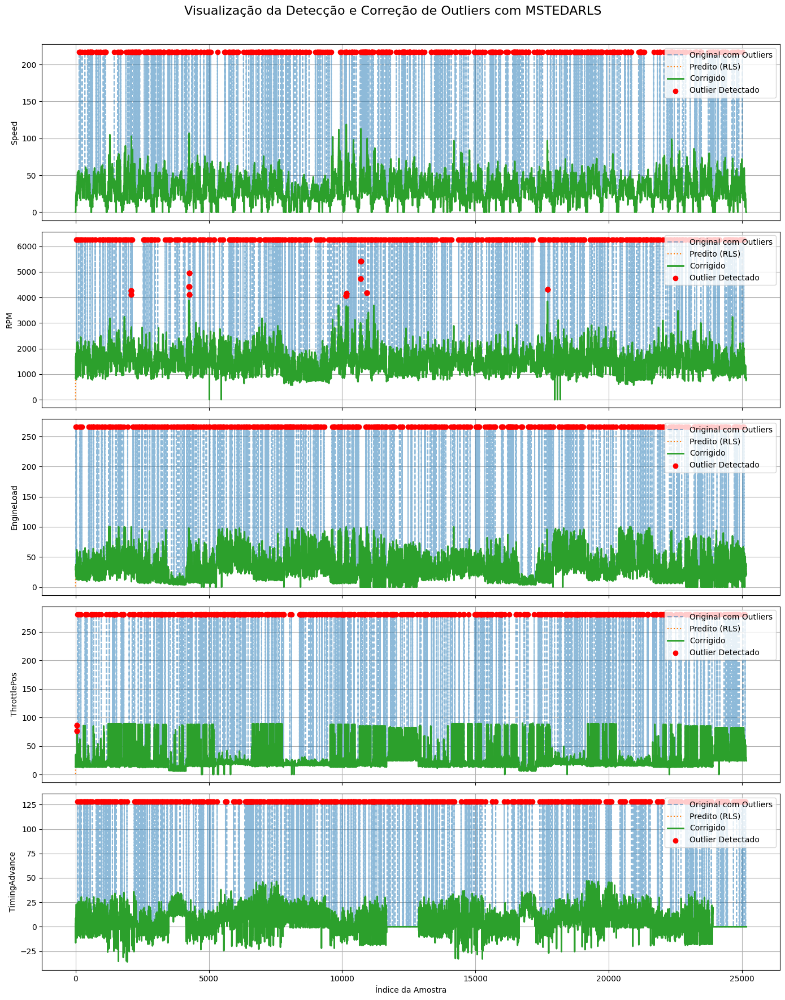

In [ ]:
# ==========================
# 2. Visualize the results
# ==========================

columns = ['Speed', 'RPM', 'EngineLoad', 'ThrottlePos', 'TimingAdvance']

fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(14, 18), sharex=True)
for i, ax in enumerate(axes):
    col = columns[i]
    
    ax.plot(X_data_injected[:, i], label="Original with Outliers", linestyle='--', alpha=0.5)
    ax.plot(predicted_data[:, i], label="Predicted (RLS)", linestyle=':')
    ax.plot(corrected_data[:, i], label="Corrected", linewidth=2)
    
    # Highlight the detected outliers
    detected_idx = np.where(outliers_mask[:, i])[0]
    ax.scatter(detected_idx, X_data_injected[detected_idx, i], color='red', label='Detected Outlier', zorder=5)
    
    ax.set_ylabel(col)
    ax.legend(loc='upper right')
    ax.grid(True)

plt.xlabel("Sample Index")
plt.suptitle("Visualization of Outlier Detection and Correction using MSTEDARLS", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix

# ==========================
# 7. Final Evaluation
# ==========================

# Calculate all metrics per feature
metrics = {
    "Feature": [],
    "Accuracy (%)": [],
    "Precision (%)": [],
    "Recall (%)": [],
    "F1-score (%)": [],
    "False Positives (%)": [],
    "False Negatives (%)": [],
}

for i, var in enumerate(columns):
    y_true = true_outliers_mask[:, i].astype(int)
    y_pred = outliers_mask[:, i].astype(int)

    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

    acc = (tp + tn) / (tp + tn + fp + fn)
    prec = tp / (tp + fp) if (tp + fp) > 0 else 0.0
    rec = tp / (tp + fn) if (tp + fn) > 0 else 0.0
    f1 = 2 * prec * rec / (prec + rec) if (prec + rec) > 0 else 0.0
    fpr = fp / (fp + tn) if (fp + tn) > 0 else 0.0
    fnr = fn / (fn + tp) if (fn + tp) > 0 else 0.0

    metrics["Feature"].append(var)
    metrics["Accuracy (%)"].append(acc * 100)
    metrics["Precision (%)"].append(prec * 100)
    metrics["Recall (%)"].append(rec * 100)
    metrics["F1-score (%)"].append(f1 * 100)
    metrics["False Positives (%)"].append(fpr * 100)
    metrics["False Negatives (%)"].append(fnr * 100)

df_metrics = pd.DataFrame(metrics).round(2)
df_metrics

,Variável,Acurácia (%),Precisão (%),Revocação (%),F1-score (%),Falsos Positivos (%),Falsos Negativos (%)
0,Speed,100.00,100.00,100.0,100.00,0.00,0.0
1,RPM,99.83,91.96,100.0,95.81,0.18,0.0
2,EngineLoad,100.00,100.00,100.0,100.00,0.00,0.0
3,ThrottlePos,99.98,98.82,100.0,99.41,0.02,0.0
4,TimingAdvance,100.00,100.00,100.0,100.00,0.00,0.0


In [ ]:
# ==========================
# 3. Save the data with injected outliers
# ==========================

df_outliers = pd.DataFrame(X_data_injected, columns=columns)
df_outliers.to_csv("../csv_files/data_with_outliers.csv", index=False)

# Save the true outlier mask as 0/1
df_true_mask = pd.DataFrame(true_outliers_mask.astype(int), columns=columns)
df_true_mask.to_csv("../csv_files/true_outlier_mask.csv", index=False)

# Save the corrected and predicted datasets
pd.DataFrame(corrected_data, columns=columns).to_csv("../csv_files/corrected_data_python.csv", index=False)
pd.DataFrame(predicted_data, columns=columns).to_csv("../csv_files/predicted_data_python.csv", index=False)

## 📈 WandB Tracking

Experiment parameters, training metrics, and evaluation results are logged to the [Weights & Biases](https://wandb.ai/) platform for systematic tracking and reproducibility.

Key benefits of using WandB include:
- Visualization of metric evolution.
- Comparison between different hyperparameter settings.
- Organized experiment management.

In [21]:
import wandb

wandb.login()

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: morsinaldo to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

In [20]:
# ================================
# Função principal de avaliação
# ================================
def train():
    run = wandb.init()
    config = run.config

    model = MSTEDARLS(
        threshold=config.threshold,
        rls_mu=config.rls_mu,
        rls_delta=config.rls_delta,
        w_init=config.w_init,
        n_features=X_data.shape[1],
        correct_outlier=True
    )

    outliers_mask = []
    for x in X_data_injected:
        _, is_outlier = model.update(x)
        outliers_mask.append(is_outlier)
    outliers_mask = np.array(outliers_mask)

    # ================================
    # Cálculo de métricas por variável
    # ================================
    metrics = {
        "Variável": [],
        "Acurácia (%)": [],
        "Precisão (%)": [],
        "Revocação (%)": [],
        "F1-score (%)": [],
        "Falsos Positivos (%)": [],
        "Falsos Negativos (%)": [],
    }

    for i, var in enumerate(columns):
        y_true = true_outliers_mask[:, i].astype(int)
        y_pred = outliers_mask[:, i].astype(int)
        tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

        acc = (tp + tn) / (tp + tn + fp + fn)
        prec = tp / (tp + fp) if (tp + fp) > 0 else 0.0
        rec = tp / (tp + fn) if (tp + fn) > 0 else 0.0
        f1 = 2 * prec * rec / (prec + rec) if (prec + rec) > 0 else 0.0
        fpr = fp / (fp + tn) if (fp + tn) > 0 else 0.0
        fnr = fn / (fn + tp) if (fn + tp) > 0 else 0.0

        # Adiciona ao dicionário local
        metrics["Variável"].append(var)
        metrics["Acurácia (%)"].append(acc * 100)
        metrics["Precisão (%)"].append(prec * 100)
        metrics["Revocação (%)"].append(rec * 100)
        metrics["F1-score (%)"].append(f1 * 100)
        metrics["Falsos Positivos (%)"].append(fpr * 100)
        metrics["Falsos Negativos (%)"].append(fnr * 100)

        # Envia para o wandb
        wandb.log({
            f"{var}/Acuracia": acc * 100,
            f"{var}/Precisao": prec * 100,
            f"{var}/Revocacao": rec * 100,
            f"{var}/F1-score": f1 * 100,
            f"{var}/Falsos_Positivos": fpr * 100,
            f"{var}/Falsos_Negativos": fnr * 100,
        })

    fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(14, 18), sharex=True)
    for i, ax in enumerate(axes):
        col = columns[i]
        
        ax.plot(X_data_injected[:, i], label="Original com Outliers", linestyle='--', alpha=0.5)
        ax.plot(predicted_data[:, i], label="Predito (RLS)", linestyle=':')
        ax.plot(corrected_data[:, i], label="Corrigido", linewidth=2)
        
        # Destacar os outliers detectados
        detected_idx = np.where(outliers_mask[:, i])[0]
        ax.scatter(detected_idx, X_data_injected[detected_idx, i], color='red', label='Outlier Detectado', zorder=5)
        
        ax.set_ylabel(col)
        ax.legend(loc='upper right')
        ax.grid(True)

    plt.xlabel("Índice da Amostra")
    plt.suptitle("Visualização da Detecção e Correção de Outliers com MSTEDARLS", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()


Create sweep with ID: izelrvbl
Sweep URL: https://wandb.ai/morsinaldo/mstedarls-sweep/sweeps/izelrvbl


wandb: Agent Starting Run: 2xzls8gd with config:
wandb: 	rls_delta: 1500
wandb: 	rls_mu: 2
wandb: 	threshold: 3.133530598102496
wandb: 	w_init: 0


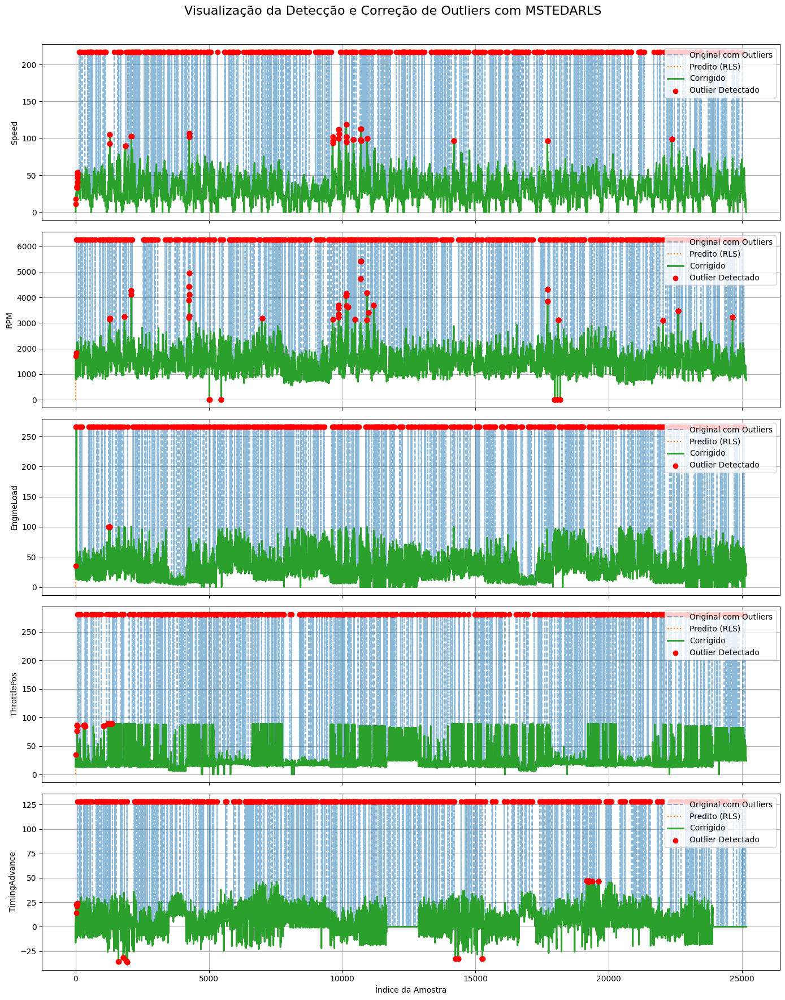

EngineLoad/Acuracia,▁
EngineLoad/F1-score,▁
EngineLoad/Falsos_Negativos,▁
EngineLoad/Falsos_Positivos,▁
EngineLoad/Precisao,▁
EngineLoad/Revocacao,▁
RPM/Acuracia,▁
RPM/F1-score,▁
RPM/Falsos_Negativos,▁
RPM/Falsos_Positivos,▁
RPM/Precisao,▁


wandb: Agent Starting Run: 4rqf90tv with config:
wandb: 	rls_delta: 1000
wandb: 	rls_mu: 1.7
wandb: 	threshold: 7.025777274630042
wandb: 	w_init: 0.5


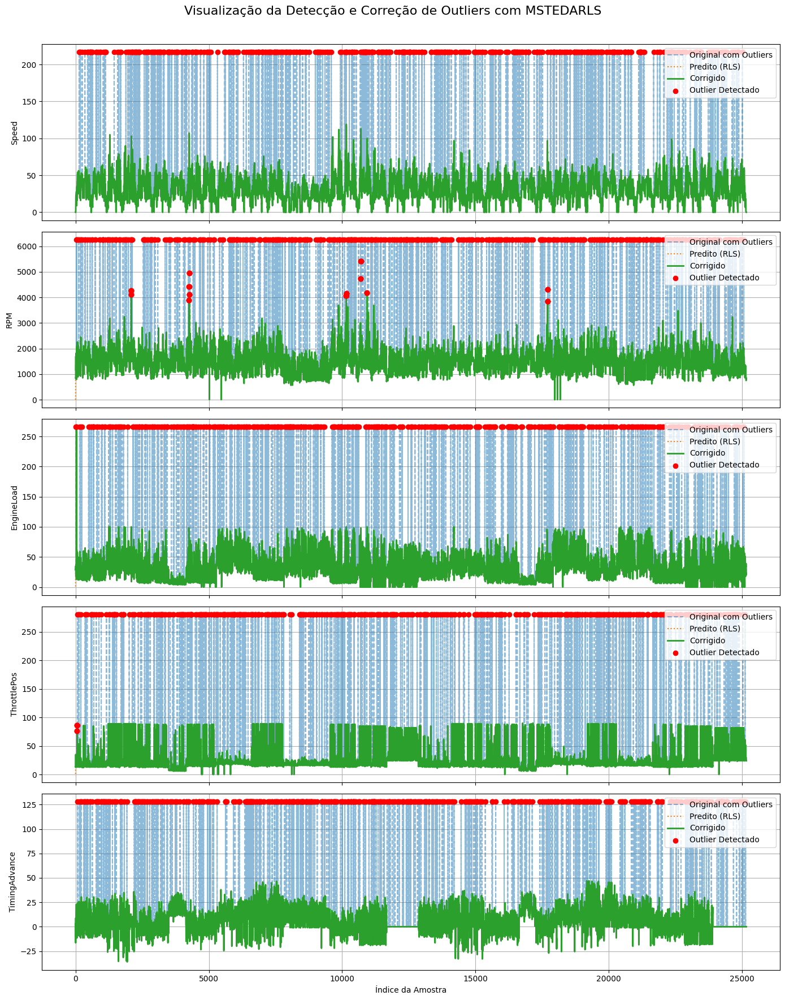

EngineLoad/Acuracia,▁
EngineLoad/F1-score,▁
EngineLoad/Falsos_Negativos,▁
EngineLoad/Falsos_Positivos,▁
EngineLoad/Precisao,▁
EngineLoad/Revocacao,▁
RPM/Acuracia,▁
RPM/F1-score,▁
RPM/Falsos_Negativos,▁
RPM/Falsos_Positivos,▁
RPM/Precisao,▁


wandb: Agent Starting Run: ikp50kwk with config:
wandb: 	rls_delta: 1750
wandb: 	rls_mu: 1
wandb: 	threshold: 9.141258701687956
wandb: 	w_init: 0


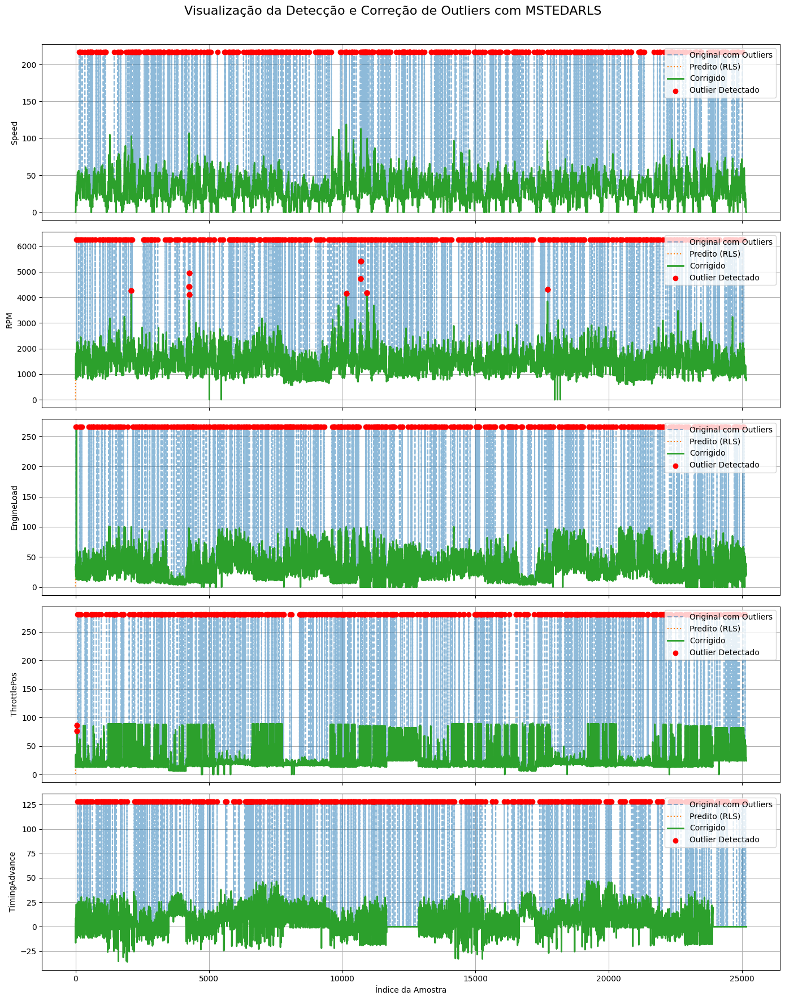

EngineLoad/Acuracia,▁
EngineLoad/F1-score,▁
EngineLoad/Falsos_Negativos,▁
EngineLoad/Falsos_Positivos,▁
EngineLoad/Precisao,▁
EngineLoad/Revocacao,▁
RPM/Acuracia,▁
RPM/F1-score,▁
RPM/Falsos_Negativos,▁
RPM/Falsos_Positivos,▁
RPM/Precisao,▁


wandb: Agent Starting Run: vos3i9to with config:
wandb: 	rls_delta: 750
wandb: 	rls_mu: 2
wandb: 	threshold: 2.2191017420696575
wandb: 	w_init: 0


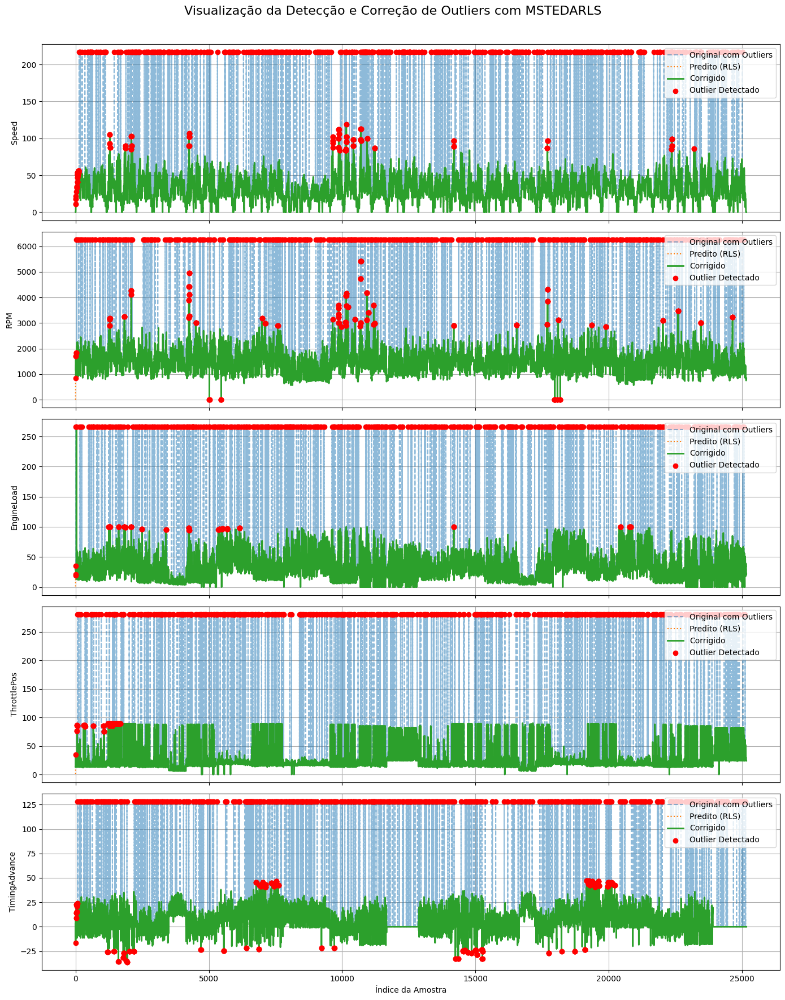

EngineLoad/Acuracia,▁
EngineLoad/F1-score,▁
EngineLoad/Falsos_Negativos,▁
EngineLoad/Falsos_Positivos,▁
EngineLoad/Precisao,▁
EngineLoad/Revocacao,▁
RPM/Acuracia,▁
RPM/F1-score,▁
RPM/Falsos_Negativos,▁
RPM/Falsos_Positivos,▁
RPM/Precisao,▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: hh4vm27a with config:
wandb: 	rls_delta: 1750
wandb: 	rls_mu: 2
wandb: 	threshold: 4.555997847578192
wandb: 	w_init: 1


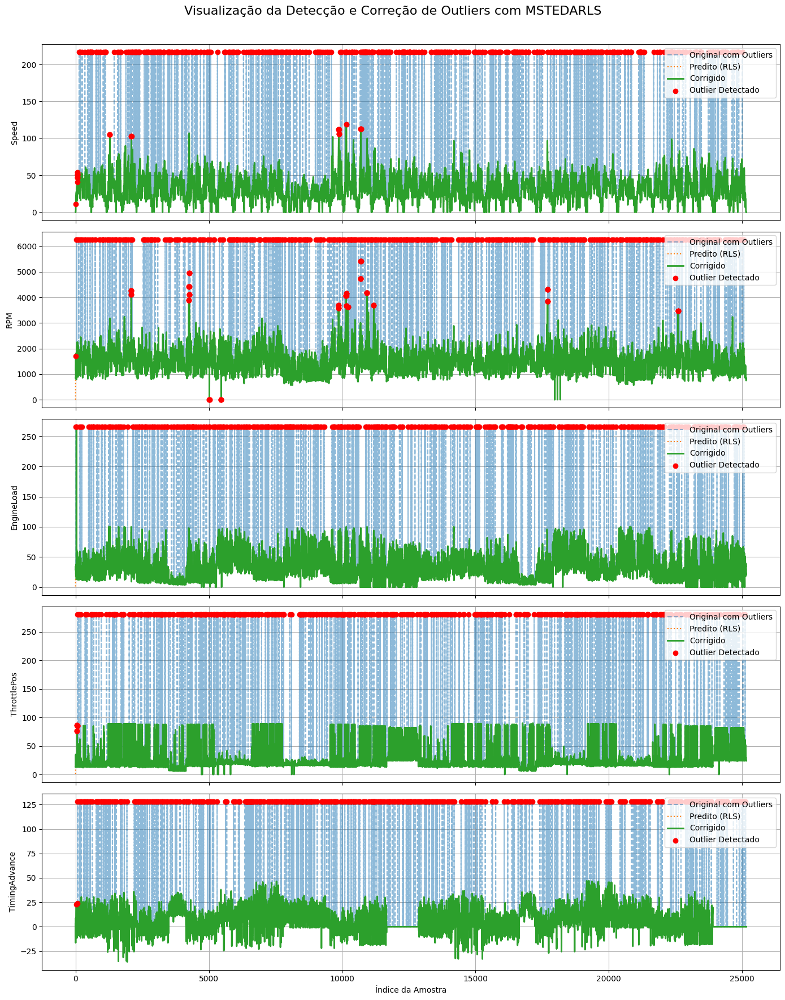

EngineLoad/Acuracia,▁
EngineLoad/F1-score,▁
EngineLoad/Falsos_Negativos,▁
EngineLoad/Falsos_Positivos,▁
EngineLoad/Precisao,▁
EngineLoad/Revocacao,▁
RPM/Acuracia,▁
RPM/F1-score,▁
RPM/Falsos_Negativos,▁
RPM/Falsos_Positivos,▁
RPM/Precisao,▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: lkqbgue1 with config:
wandb: 	rls_delta: 500
wandb: 	rls_mu: 0.7
wandb: 	threshold: 7.890039770663346
wandb: 	w_init: 1


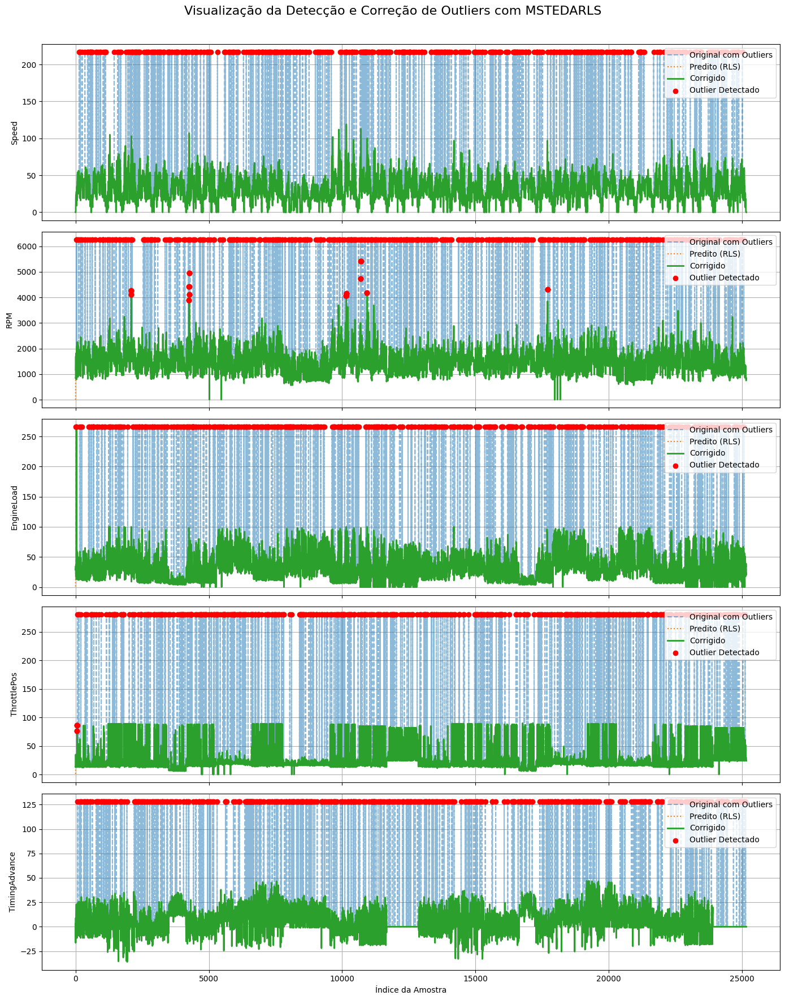

EngineLoad/Acuracia,▁
EngineLoad/F1-score,▁
EngineLoad/Falsos_Negativos,▁
EngineLoad/Falsos_Positivos,▁
EngineLoad/Precisao,▁
EngineLoad/Revocacao,▁
RPM/Acuracia,▁
RPM/F1-score,▁
RPM/Falsos_Negativos,▁
RPM/Falsos_Positivos,▁
RPM/Precisao,▁


wandb: Agent Starting Run: zmp5lrvd with config:
wandb: 	rls_delta: 1250
wandb: 	rls_mu: 0.7
wandb: 	threshold: 8.801811493103823
wandb: 	w_init: 0.5


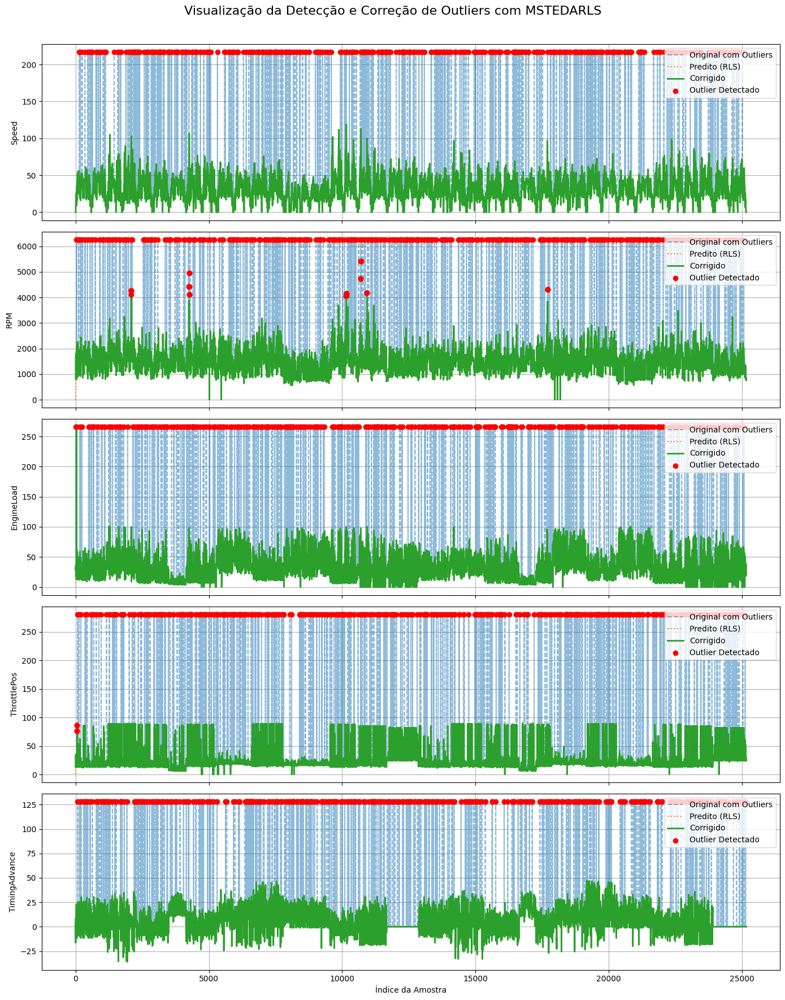

EngineLoad/Acuracia,▁
EngineLoad/F1-score,▁
EngineLoad/Falsos_Negativos,▁
EngineLoad/Falsos_Positivos,▁
EngineLoad/Precisao,▁
EngineLoad/Revocacao,▁
RPM/Acuracia,▁
RPM/F1-score,▁
RPM/Falsos_Negativos,▁
RPM/Falsos_Positivos,▁
RPM/Precisao,▁


wandb: Agent Starting Run: 78t3901n with config:
wandb: 	rls_delta: 1500
wandb: 	rls_mu: 0.7
wandb: 	threshold: 2.6998340184516367
wandb: 	w_init: 0.5


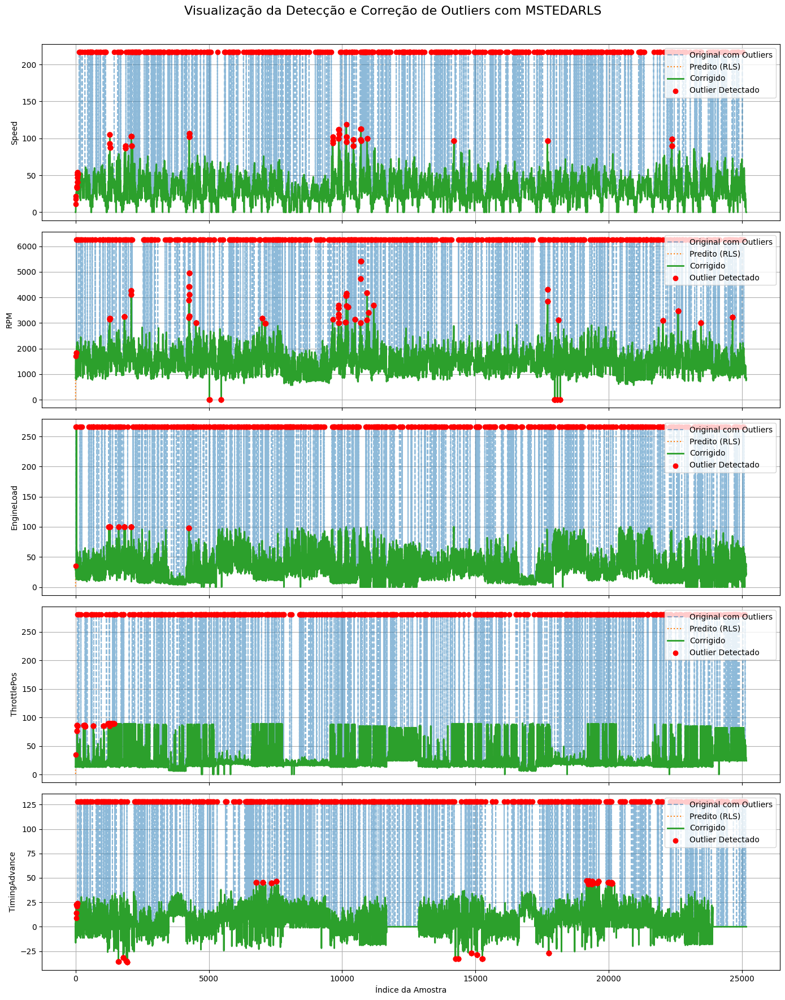

EngineLoad/Acuracia,▁
EngineLoad/F1-score,▁
EngineLoad/Falsos_Negativos,▁
EngineLoad/Falsos_Positivos,▁
EngineLoad/Precisao,▁
EngineLoad/Revocacao,▁
RPM/Acuracia,▁
RPM/F1-score,▁
RPM/Falsos_Negativos,▁
RPM/Falsos_Positivos,▁
RPM/Precisao,▁


wandb: Agent Starting Run: w3rieutf with config:
wandb: 	rls_delta: 2000
wandb: 	rls_mu: 0.9
wandb: 	threshold: 6.236880127366988
wandb: 	w_init: 0


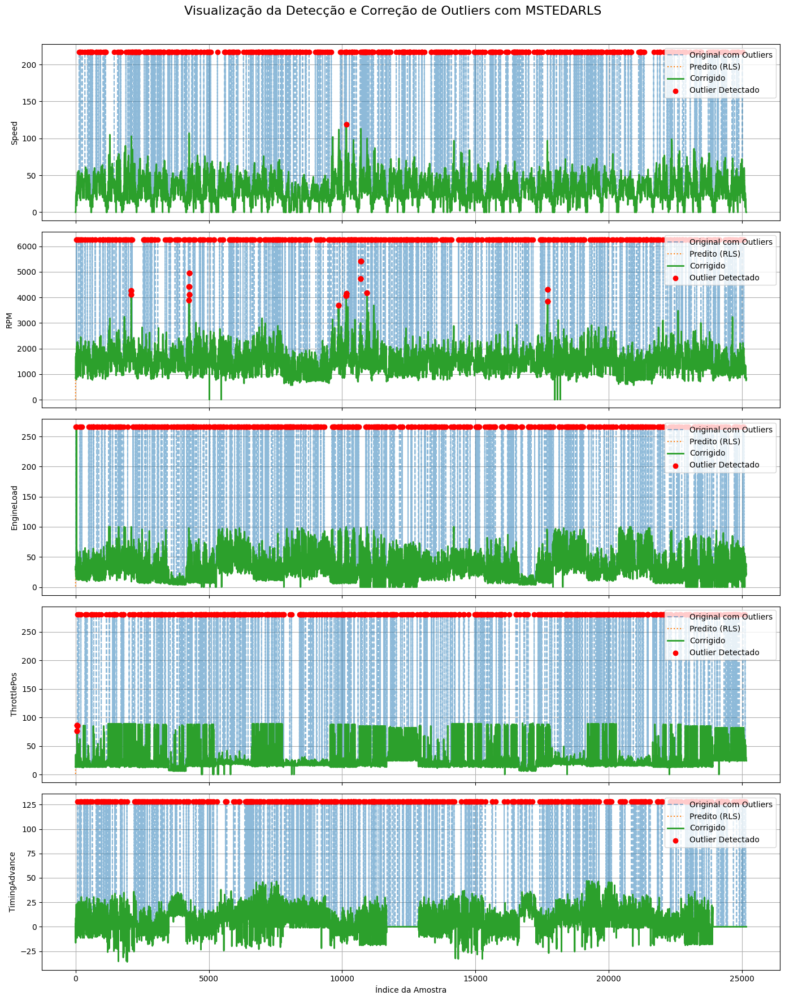

EngineLoad/Acuracia,▁
EngineLoad/F1-score,▁
EngineLoad/Falsos_Negativos,▁
EngineLoad/Falsos_Positivos,▁
EngineLoad/Precisao,▁
EngineLoad/Revocacao,▁
RPM/Acuracia,▁
RPM/F1-score,▁
RPM/Falsos_Negativos,▁
RPM/Falsos_Positivos,▁
RPM/Precisao,▁


wandb: Agent Starting Run: qo74ur3b with config:
wandb: 	rls_delta: 1000
wandb: 	rls_mu: 0.7
wandb: 	threshold: 8.413572164929587
wandb: 	w_init: 1


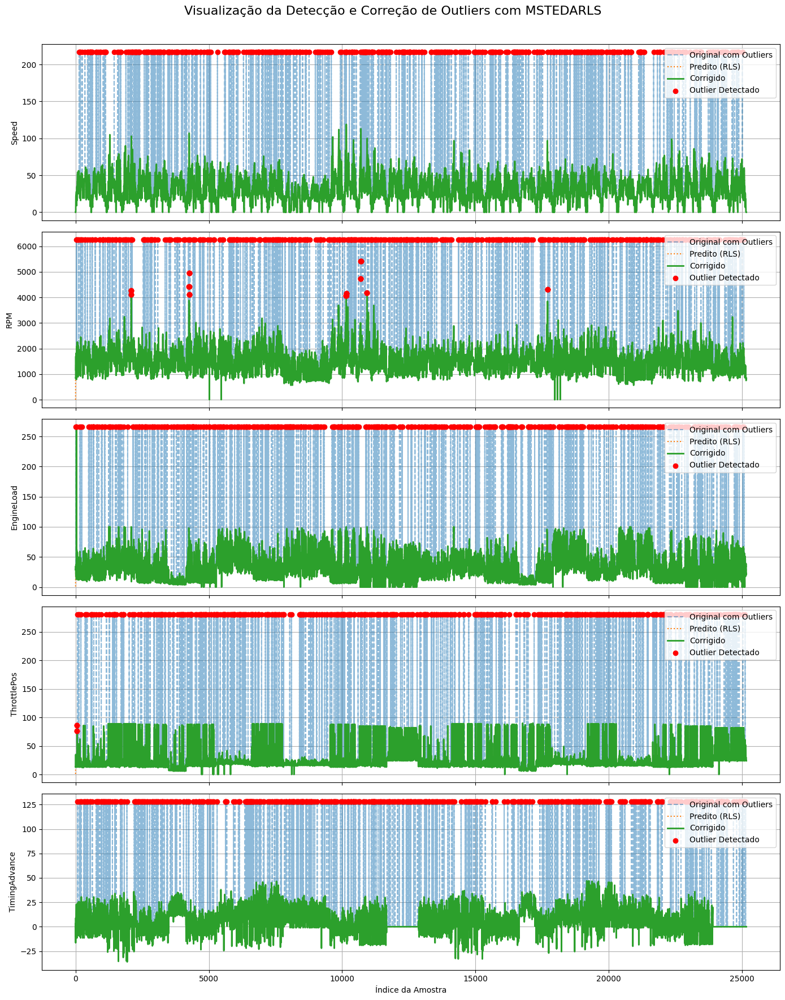

EngineLoad/Acuracia,▁
EngineLoad/F1-score,▁
EngineLoad/Falsos_Negativos,▁
EngineLoad/Falsos_Positivos,▁
EngineLoad/Precisao,▁
EngineLoad/Revocacao,▁
RPM/Acuracia,▁
RPM/F1-score,▁
RPM/Falsos_Negativos,▁
RPM/Falsos_Positivos,▁
RPM/Precisao,▁


In [22]:
# ================================
# Configuração do sweep
# ================================
sweep_config = {
    "method": "bayes",
    "metric": {"name": "speed/F1-score", "goal": "maximize"},
    "parameters": {
        "threshold": {"min": 2.0, "max": 10.0},
        "rls_mu": {"values": [0.5, 0.7, 0.9, 1.0, 1.2, 1.5, 1.7, 2.0]},
        "rls_delta": {"values": [500.0, 750.0, 1000.0, 1250.0, 1500.0, 1750.0, 2000.0]},
        "w_init": {"values": [0.0, 0.5, 1.0]}
    }
}

# ================================
# Inicializar sweep e rodar agente
# ================================
sweep_id = wandb.sweep(sweep_config, project="mstedarls-sweep")
wandb.agent(sweep_id, function=train, count=10)

In [ ]:
wandb.finish()